## 子宫颈图片反光部分的自动检测
<br/>

- 反光部分的分割
  - 准确度
  - 召回率
<br/>
<br/>
- 反光部分的填充
<br/>

## 目录
<br/>
- 一些文章里的算法的分析和实现
<br/>
<br/>
- 最终采用的算法
<br/>
<br/>

In [1]:
import os
import random
import glob
import time
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt
import torch
import torchvision
from torchvision import datasets , models , transforms
from PIL import Image
from sklearn.mixture  import GaussianMixture
%matplotlib inline

In [2]:
from scipy.ndimage import sobel, generic_gradient_magnitude , prewitt,sobel
from skimage import color

In [3]:
from scipy.ndimage.filters import median_filter

In [4]:
import skimage.filters.rank  as sfr
from skimage.morphology import diamond,dilation,disk,square
from skimage.restoration import inpaint
from skimage.measure import find_contours

#  多阶段的分割算法

-  Intensity $I = \frac{R + G + B}{3}$ Saturation $S = 1 - \frac{\min(R,G,B)}{I} $
$$
I > 0.4 * I_{max}\ \  and\ \  S < 0.6 * S_{max}
$$

- gradient magnitude  $ |\triangledown G| = \sqrt{(\frac{\partial I}{\partial x})^2 + (\frac{\partial I}{\partial y})^2}$ 
$$
|\triangledown G| > 0.15
$$

 -  Gaussin Mixture Model cluster
概率密度函数
$$
p(x_{i}) = \sum_{k=1}^{K}\pi_{k}P(x_i|j) \\
= \sum_{k=1}^{K}\pi_{k} \mathcal{N}(x_i|\mu_k,\Sigma_k)
$$
   - S -- V feature space, where S and V are Saturation and Value of the standard HSV color space

  - 似然函数：
  $$
  \prod_{i=1}^{N}p(x_i)
  $$
  - log似然函数：
  $$
  \sum_{i=1}^{N}\log p(x_i) = \sum_{i=1}^{N}\log (\sum_{k=1}^{K}\pi_{k} \mathcal{N}(x_i|\mu_k,\Sigma_k))
  $$
  
 
  

 - EM算法：引入因变量z，似然函数变为：$$\prod_{i=1}^{N}p(x_i,z_i) = \prod_{i=1}^{N}p(z_i)p(x_i|z_i) = \prod_{i=1}^{N} \prod_{k=1}^{K}(\pi_k)^{z_k}\mathcal{N}(x_i|\mu_k,\Sigma_k)^{z_k}$$
 


- log似然：$$\sum_{i=1}^{N}\sum_{i=1}^{N}z_{ik}\{\log \pi_k + \log \mathcal{N}(x_i|\mu_k,\Sigma_k)\}$$

 - 估计$z_k$,根据后验概率取期望：$$z_k = 0 * p(z_k = 0|x) + 1 * p(z_k = 1 | x) \\
 = p(z_k = 1 | x) \\= \frac{p(x)p(x|z_k =1)}{p(z_k)} \\= \frac{\pi_k\mathcal{N}(x|\mu_k,\Sigma_k)}{\sum_{j=1}^{K}\pi_j\mathcal{N}(x|\mu_j,\Sigma_j)}$$

 mixture of Gaussian the EM is the following.

Repeat until converged:
* E-step. Compute the expectations, or responsibilities $r_{j,i}$, of the latent variables $v_i$, where $j$ represents the classes, $y$ the data points, and $i$ the $ith$ points:
$$\begin{equation}
r_{j,i} = \frac{\omega_j P(y_i~|~\mu_j,\Sigma_j)}{\sum_j \omega_j P(y_i~|~\mu_j,\Sigma_j)}
\end{equation}
$$

* M-step. Compute the maximum likelihood parameters given these responsibilities:

    * (1) The weigths for the mixing proportions, $\omega_j$, where $N$ is the number of data points:
    The estimate of the probability of a class as an outcome is the proportion of times it appears:
$$\begin{equation}
\omega_j ← \arg\max \sum_i \sum_j r_{j,i} log P(z_i = j) = \sum_i \sum_j r_{j,i} log \omega_j = \frac{1}{N}\sum_i r_{j,i}
\end{equation}
$$

    * (2) The means and the variances for the Gauss distributions, $\mu_j$, $\sigma_j$ :
    We want to maximize this term:
$$\begin{equation}
\arg\max \sum_i r_{j,i} log P(y_i~|~v_i = j) = \sum_i r_{j,i} log Gaussian(y_i; \mu_j, \sigma_j)
\end{equation}
$$
$$\begin{equation}
\mu_j ←  \frac{1}{\sum_i r_{j,i}} \sum_i r_{j,i} y_i
\end{equation}
$$
$$\begin{equation}
\sigma_j ←  \frac{1}{\sum_i r_{j,i}} \sum_i r_{j,i} (y_i - \mu_j)^2
\end{equation}
$$

## 填充算法
![](./alg.png)


In [5]:
path_train = "/home/xpwang/Downloads/colposcope3/train/"
data_set = datasets.ImageFolder(path_train)
image = data_set[2212][0]

In [6]:
def multile_stage(image,I_lamda = 0.7,S_lamda = 0.1) :
    # 转换成array
    arr = np.array(image)
    
    # 计算intensity 和 sataration
    arr_I = np.mean(arr,axis =2)
    arr_S = 1 - np.min(arr,axis=2) / (arr_I+1e-7)
    
    # 根据阈值生成mask
    ise = arr_I > I_lamda * np.max(arr_I)
    sse = arr_S < S_lamda * np.max(arr_S)
    
    # 计算梯度
    magnitude = generic_gradient_magnitude(arr_I,sobel)
    mse = magnitude > np.percentile(magnitude,97)
    
    #第一阶段的效果
    select_1 = ise & sse
    print(ise.sum(),sse.sum(),mse.sum())
    arr_1 = arr.copy()
    arr_1[:,:,0][select_1] = 0
    arr_1[:,:,1][select_1] = 0
    arr_1[:,:,2][select_1] = 0
    
    # 第二阶段的效果
    select = ise & sse | mse
    
    arr[:,:,0][select] = 0
    arr[:,:,1][select] = 0
    arr[:,:,2][select] = 0
    return arr_1,arr,select_1,select,mse

In [7]:
def gassin_process(image,mask):
    arr = np.array(image)
    mask = mask.copy()
    
    arr_I = np.mean(arr,axis =2)
    arr_S = 1 - np.min(arr,axis=2) / (arr_I+1e-7)
    
    hsv = color.rgb2hsv(arr)
    S = arr_S[mask]
    V = hsv[:, :, 2][mask]
    X = np.vstack((S, V)).T
    model = GaussianMixture(n_components=2, covariance_type="full", max_iter=20000)
    model.fit(X)
    resoult = model.predict(X)

    mask[mask][resoult == 0] = False


    arr[:, :, 0][mask] = 0.0
    arr[:, :, 1][mask] = 0.0
    arr[:, :, 2][mask] = 0.0
    
    return arr,mask
        

In [8]:
def fill_process(image,mask,kenel_size = 20) :
    image = np.array(image)
    mask = mask.copy()
    mask = dilation(mask,selem=square(5))


    image[:, :, 0][mask != 0] = 0.0
    image[:, :, 1][mask != 0] = 0.0
    image[:, :, 2][mask != 0] = 0.0
    while(mask.sum() != 0) :
        init = mask.sum()
        shape = mask.shape
        print(mask.sum())
        for i in range(mask.shape[0]) :
            for j in range(mask.shape[1]) :
                nz = 0
                sum_nz = np.array([0,0,0])
                if mask[i,j] != 0  :
                    for ni in np.array(range(kenel_size)) - kenel_size/2:
                        x = int(i + ni)
                        for nj in np.array(range(kenel_size))- kenel_size/2 :
                            y = int(j + nj)
                            if x >0 and x < shape[0] and y > 0 and y < shape[1] and image[x,y,:].sum() != 0 and image[x,y,:].sum() < 245*3:
                                nz += 1
                                sum_nz += image[x,y,:]
                    if nz != 0 :
                        image[i,j,:] = sum_nz / nz
                        mask[i,j] = False
#                         print(mask.sum())
        if init == mask.sum() :
#             image[:, :, 0][self.select] = np.median(self.arr[:,:,0])
#             self.arr[:, :, 1][self.select] = np.median(self.arr[:,:,1])
#             self.arr[:, :, 2][self.select] = np.median(self.arr[:,:,2])
            break
    return image

In [9]:
test1,test2,mask1,mask2,ise= multile_stage(image)

86692 71817 11902


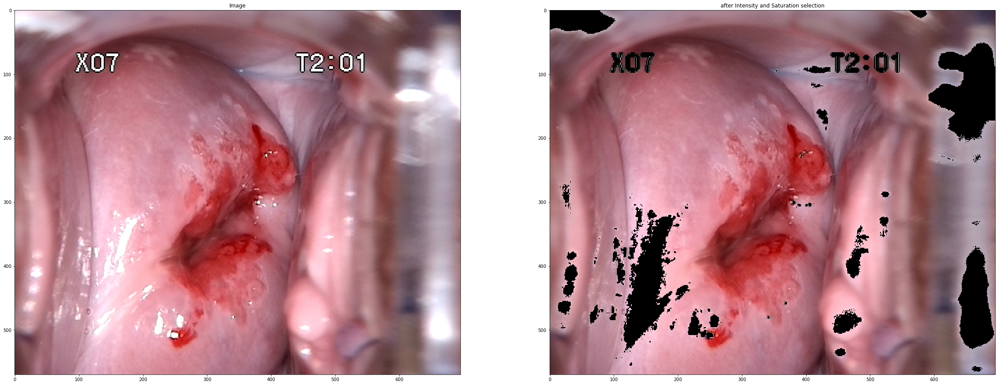

In [10]:
plt.figure(figsize=(40,40))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Image")
plt.subplot(1,2,2)
plt.imshow(test1)
plt.title("after Intensity and Saturation selection")


In [11]:
test3,mask3 = gassin_process(image,mask2)
test4 = fill_process(image,mask2)

77627
422


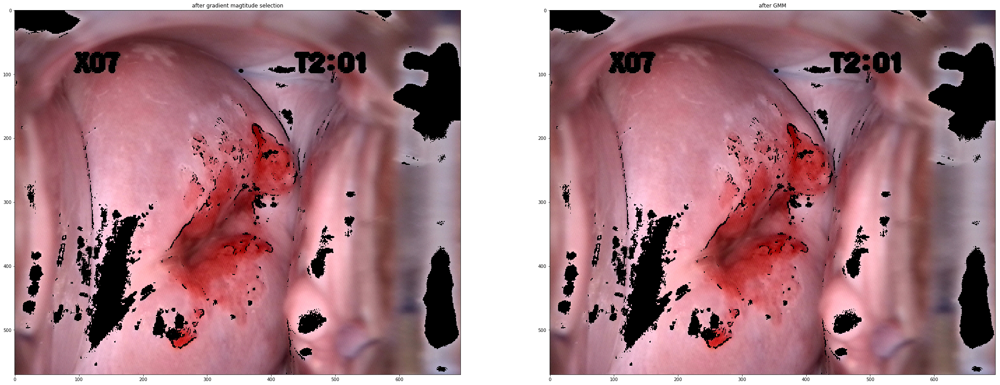

In [12]:
plt.figure(figsize=(40,40))
plt.subplot(1,2,1)
plt.imshow(test2)
plt.title("after gradient magtitude selection")
plt.subplot(1,2,2)
plt.imshow(test3)
plt.title("after GMM")

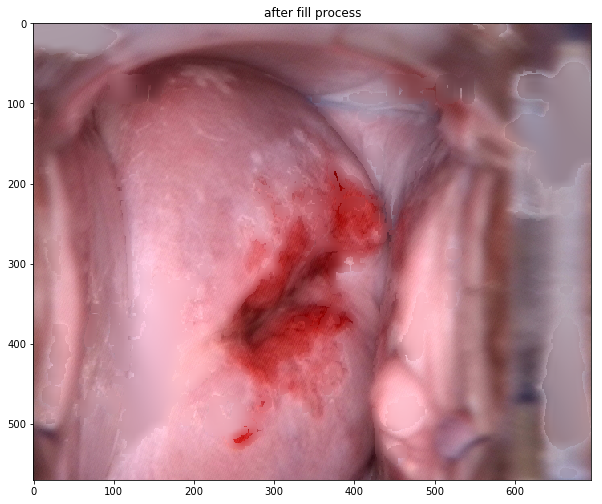

In [13]:
plt.figure(figsize=(10,10))
# plt.subplot(1,2,1)
plt.imshow(test4)
plt.title("after fill process")

# 第二种分割算法

- stage1:
    - $c_E = 0.2989 · c_R + 0.5870·c_G + 0.1140·c_B$
    - $r_{GE} = \frac{P_{95}(c_{G})}{P_{95}(c_E)}$ $r_{BE} = \frac{P_{95}(c_{B})}{P_{95}(c_E)}$
    - $c_{G}(x_0) > r_{GE} * T_1 \mid c_{B}(x_0) > r_{BE} * T_1 \mid c_E(x_0) > T_1 $



- stage2:
    - $\varepsilon(x_0) = \max \{ \frac{c_R(x_0)}{c^*_R(x_0)},\frac{c_G(x_0)}{c^*_G(x_0)},\frac{c_B(x_0)}{c^*_B(x_0)} \} $
    - $c^*(x) 是一个经过填充，滤波后的图片$
    - $\varepsilon(x) > T_2$

- stage3:
    - $\frac{1}{N}\sum_{i=1}{N}|grad(E_n)| > T_3 \land N > N_{min}$

![](./alg5.png)

![](./alg2.png)

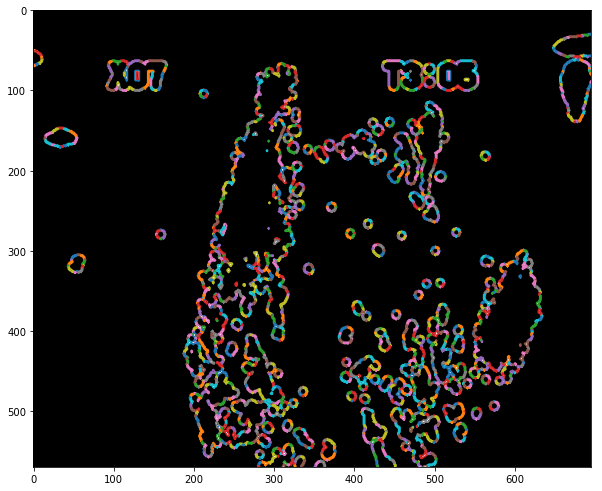

In [95]:
contour_list = find_contours(modual_2(),0.1)
plt.figure()
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(modual_2(),cmap = "gray")
for contour in contour_list :
    ax.plot(contour[:,1],contour[:,0])

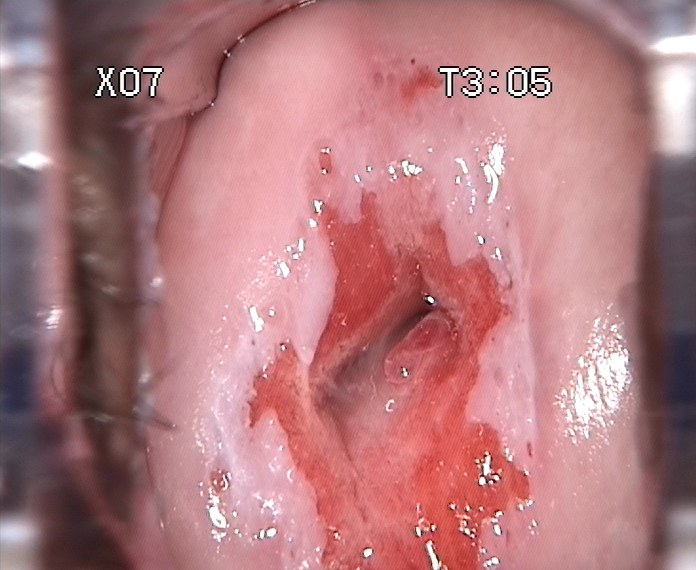

In [94]:
image

# 比较好的方法
- 算法要有很好的鲁棒性，不能在一张图片上过拟合
- 思想就是既要考虑召回率又要考虑准确度，加一点，减一点
- 算法要考虑到数据本身的实际情况，不能简单的拿来套用，比如要考虑消除图片上的tag，图片反光的特征


####  stage1: 根据每一个像素点的variance，选出反光部分的一个尽可能大的真子集
#### stage2: 为了消除边界部分反光的点，防止填充的时候影响效果，把上一步的mask矩阵进行一个扩充
#### stage3: 进行第一次填充
#### stage4: 上一步填充完还是有一些孤立的反光点没有被消除，所以把上一步的填充做一个中值滤波，利用第二篇文章的思想，用滤波后的照片作填充，作为最后的结果

In [40]:
def sr_mark(image) :
    arr = np.array(image)
    sele_var = np.var(arr,axis=2)
#     sele_min = np.min(arr,axis = 2)
    choose = sele_var.copy()
    choose[:,:] = False
    choose[50:120,80:570][sele_var[50:120,80:570] <100] = True
    choose[120:,80:643][sele_var[120:,80:643] <100] = True

#     choose[60:633,63:575][sele_min[60:633,63:575] > 180] = True
    arr[:,:,0][choose != 0] = 0
    arr[:,:,1][choose != 0] = 0
    arr[:,:,2][choose != 0] = 0
#     arr[:,:,0] = median_filter(arr[:,:,0],size=5)
#     arr[:,:,1] = median_filter(arr[:,:,1],size=5)
#     arr[:,:,2] = median_filter(arr[:,:,2],size=5)
    choose = dilation(choose,selem=square(5))
    return arr,choose

In [41]:
def fill_process(image,mask,kenel_size = 20) :
    mask = mask.copy()
    image = np.array(image)
    image[:, :, 0][mask != 0] = 0.0
    image[:, :, 1][mask !=0] = 0.0
    image[:, :, 2][mask != 0] = 0.0
    while(mask.sum() != 0) :
        init = mask.sum()
        shape = mask.shape
        for i in range(mask.shape[0]) :
            for j in range(mask.shape[1]) :
                nz = 0
                sum_nz = np.array([0,0,0])
                if mask[i,j] != 0  :
                    for ni in np.array(range(kenel_size)) - kenel_size/2:
                        x = int(i + ni)
                        for nj in np.array(range(kenel_size))- kenel_size/2 :
                            y = int(j + nj)
                            if x >0 and x < shape[0] and y > 0 and y < shape[1] and image[x,y,:].sum() != 0 and image[x,y,:].sum() < 245*3:
                                nz += 1
                                sum_nz += image[x,y,:]
                    if nz != 0 :
                        image[i,j,:] = sum_nz / nz
                        mask[i,j] = False
#                         print(mask.sum())
        if init == mask.sum() :
#             image[:, :, 0][self.select] = np.median(self.arr[:,:,0])
#             self.arr[:, :, 1][self.select] = np.median(self.arr[:,:,1])
#             self.arr[:, :, 2][self.select] = np.median(self.arr[:,:,2])
            break
    return image

In [48]:
def background(image,back,percent = 99.5) :
    back = back.copy()
    image = image.copy()
    
    back[:,:,0] = median_filter(back[:,:,0],size=10)
    back[:,:,1] = median_filter(back[:,:,1],size =10)
    back[:,:,2] = median_filter(back[:,:,2],size= 10)
    
    mask = np.min(image / back ,axis =2 )
    
    image[mask > np.percentile(mask,percent),:] = back[mask > np.percentile(mask,percent),:]
    return image,mask,back

In [ ]:
_,mask = sr_mark(image)
paint_2 = fill_process(image,mask)
paint_4,mask_4,back_4 = background(paint_2,paint_2)

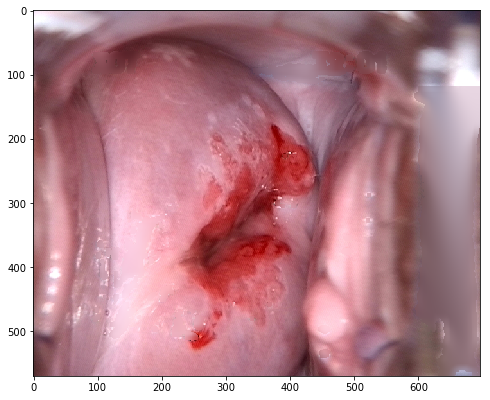

In [15]:
plt.figure(figsize=(8,8))
plt.imshow(paint_2)
plt.title("after var remove and fill")

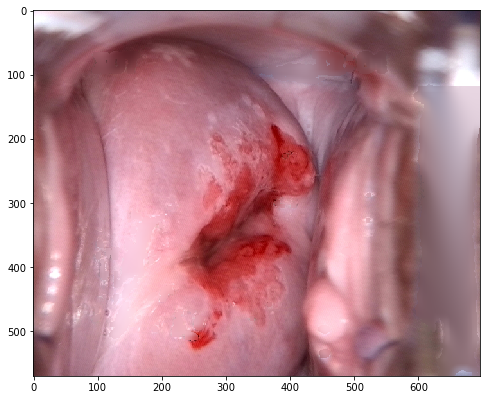

In [215]:
plt.figure(figsize=(8,8))
plt.imshow(paint_4)
plt.title("after background fillprocess")

In [39]:
import glob
showfile = glob.glob("./show/*")

In [81]:

def show(k ) :
    _, basename = os.path.split(showfile[k])
    resoult = "./output/show/" + basename
    plt.figure(figsize=(100,40))
    plt.subplot(1,2,1)
    plt.imshow(Image.open(showfile[k]))
    plt.subplot(1,2,2)
    plt.imshow(Image.open(resoult))


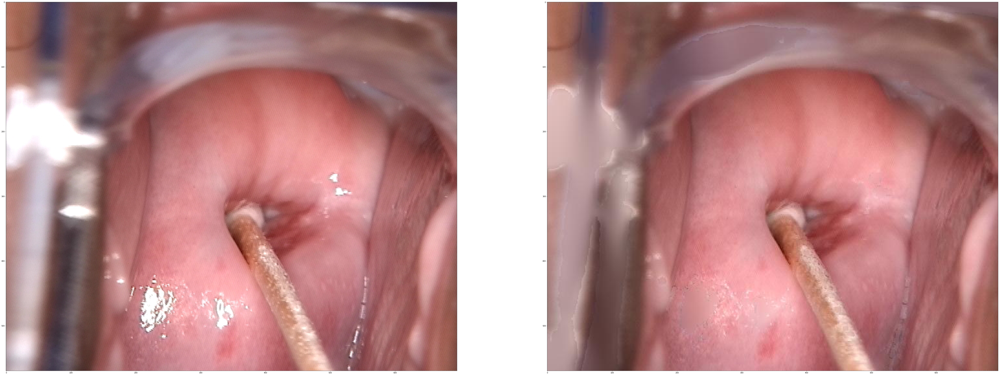

In [82]:
 show(1)

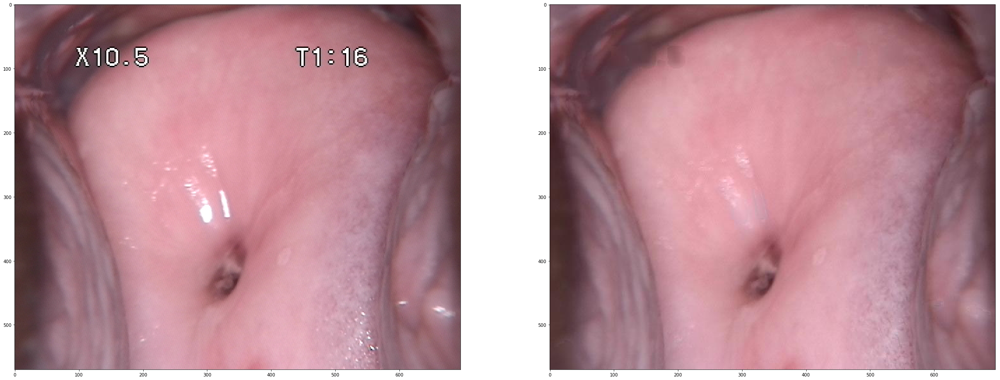

In [57]:
show(2)

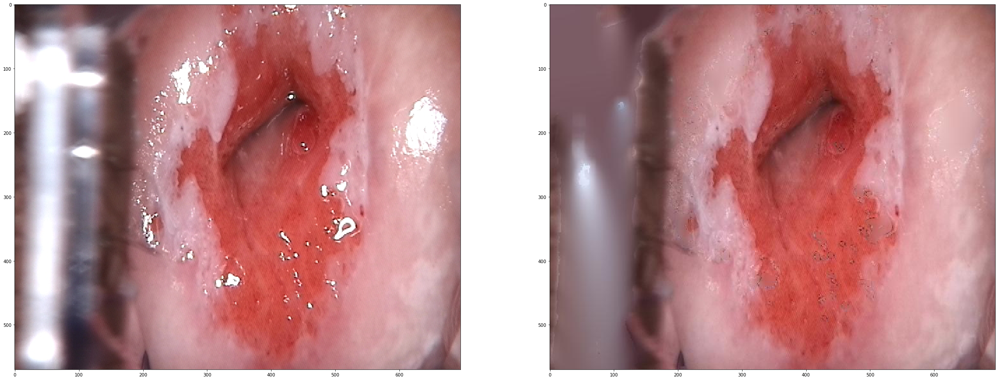

In [58]:
show(3)

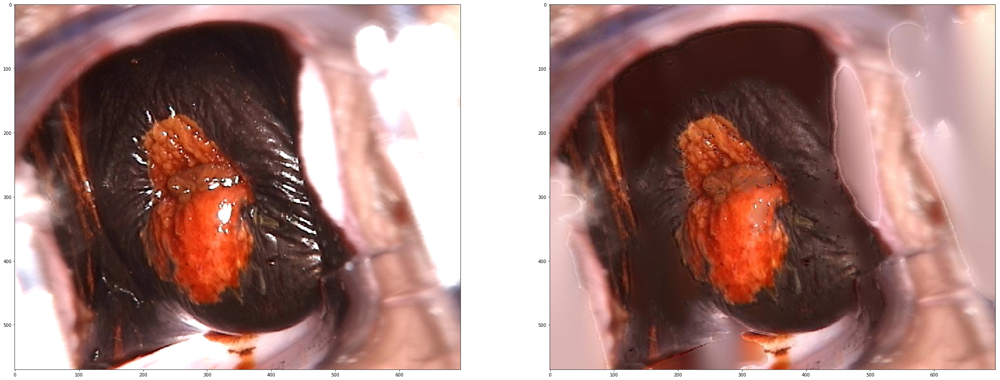

In [79]:
show(4)

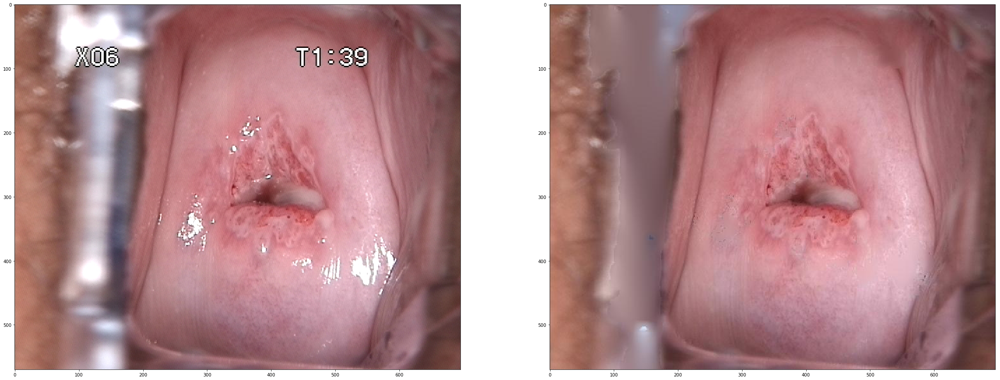

In [80]:
show(5)

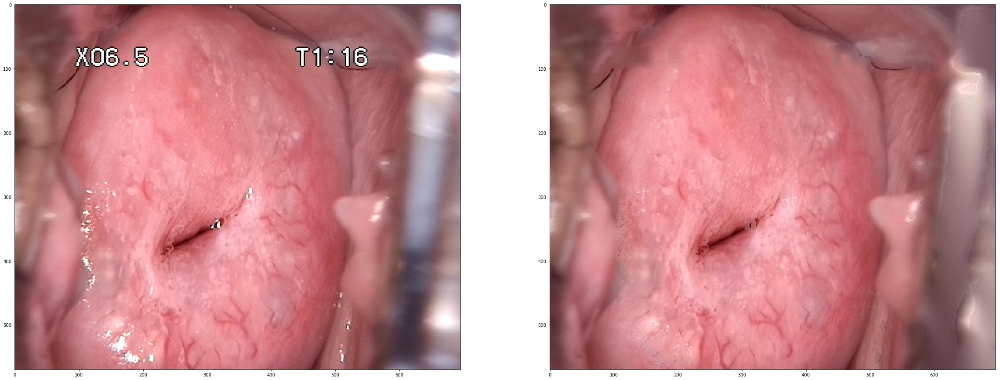

In [62]:
show(9)

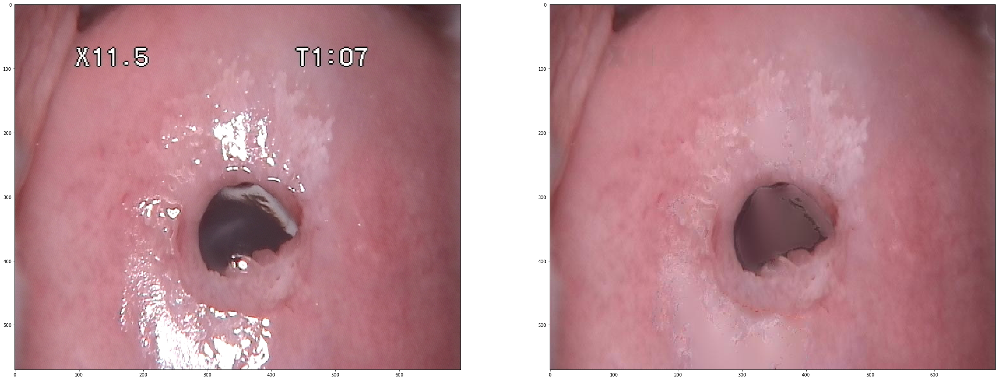

In [64]:
show(np.random.randint(1)%80)

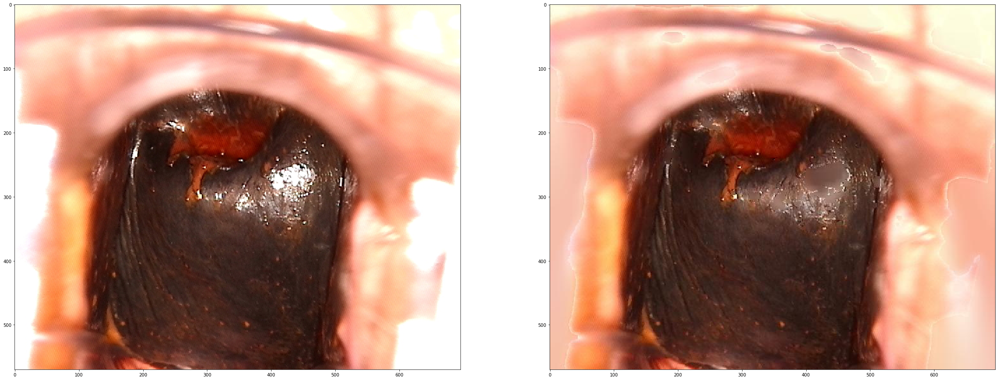

In [72]:
show(np.random.randint(80))

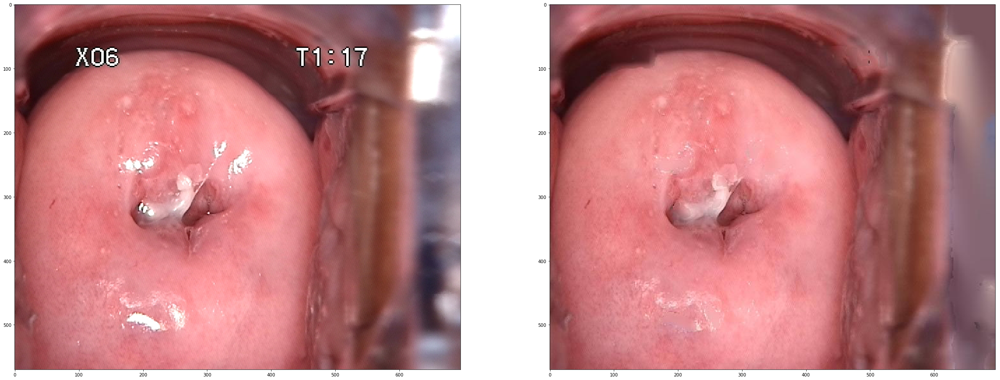

In [78]:
show(np.random.randint(80))

# 🔚

# Why must remove the reflection

In [88]:
image = data_set[100][0]

In [89]:
def modual_1(image_array = np.array(image),T_1 = 250) :
    image_energy = 0.2989 * image_array[:,:,0] + 0.5870 * image_array[:,:,1] + 0.1140 * image_array[:,:,2]
    r_ge = np.percentile(image_array[:,:,1],98) / np.percentile(image_energy,97)
    r_be = np.percentile(image_array[:,:,2],98) / np.percentile(image_energy,97)
    image_mask = image_energy.copy()
    image_mask[:,:] = 0
    image_mask[image_array[:,:,0] > T_1 ] = 1
    image_mask[image_array[:,:,1] > r_ge * T_1 ] = 1
    image_mask[image_array[:,:,2] > r_be * T_1] = 1
    return image_mask

In [90]:
def modual_2(image_array = np.array(image)) :
    image_mask = modual_1(T_1=240)
#     dila2 = binary_dilation(image_mask,structure=generate_binary_structure(2,2)).astype(image_mask.dtype)
#     dila4 = binary_dilation(image_mask,structure=generate_binary_structure(2,4)).astype(image_mask.dtype)
    dila2 = dilation(image_mask,selem=disk(4))
    dila4 = dilation(image_mask,selem=disk(5))
    return np.abs(dila2-dila4)